In [1]:
import numpy as np  
import pandas as pd 
import folium
import json
import seaborn as sns
import matplotlib.pyplot as plt
import plotly
import plotly.express as px
#info is taken from European Social Survey https://www.europeansocialsurvey.org/downloadwizard/ 

In [2]:
with open('europemap.json') as f: 
    datos = json.load(f)

In [3]:
datos['features'][9]['properties']['ISO2'] #find the country code in json

'AT'

In [4]:
df =pd.read_csv('europa.csv')

In [22]:
df

,cntry,cname,cedition,cproddat,cseqno,name,essround,edition,idno,dweight,...,tvtot,tvpol,rdtot,rdpol,nwsptot,nwsppol,gndr,ipcrtiv,imprich,ipeqopt
0,AT,ESS1-9e01,1.0,10.12.2020,1,ESS1e06_6,1,6.6,1,0.9452,...,1,1,1,1,1,1,1,2.0,3.0,1.0
1,AT,ESS1-9e01,1.0,10.12.2020,2,ESS1e06_6,1,6.6,2,0.4726,...,3,2,4,1,2,2,1,1.0,3.0,1.0
2,AT,ESS1-9e01,1.0,10.12.2020,3,ESS1e06_6,1,6.6,3,0.9452,...,7,3,0,66,0,66,2,2.0,3.0,2.0
3,AT,ESS1-9e01,1.0,10.12.2020,4,ESS1e06_6,1,6.6,4,0.9452,...,1,1,1,1,2,2,1,1.0,5.0,2.0
4,AT,ESS1-9e01,1.0,10.12.2020,5,ESS1e06_6,1,6.6,6,1.8905,...,0,66,1,1,0,66,2,3.0,5.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42354,SI,ESS1-9e01,1.0,10.12.2020,388135,ESS1e06_6,1,6.6,1810,1.0000,...,1,1,0,66,0,66,1,2.0,2.0,3.0
42355,SI,ESS1-9e01,1.0,10.12.2020,388136,ESS1e06_6,1,6.6,1811,1.0000,...,3,3,2,2,1,0,2,2.0,4.0,2.0
42356,SI,ESS1-9e01,1.0,10.12.2020,388137,ESS1e06_6,1,6.6,1812,1.0000,...,7,2,0,66,0,66,1,3.0,3.0,3.0
42357,SI,ESS1-9e01,1.0,10.12.2020,388138,ESS1e06_6,1,6.6,1813,1.0000,...,2,2,2,2,1,0,1,1.0,4.0,1.0


In [27]:
df['cntry'].unique()

array(['AT', 'BE', 'CH', 'CZ', 'DE', 'DK', 'ES', 'FI', 'FR', 'GB', 'GR',
       'HU', 'IE', 'IL', 'IT', 'LU', 'NL', 'NO', 'PL', 'PT', 'SE', 'SI'],
      dtype=object)

In [39]:
df.iloc[:,1:12]

,cname,cedition,cproddat,cseqno,name,essround,edition,idno,dweight,pspwght,pweight
0,ESS1-9e01,1.0,10.12.2020,1,ESS1e06_6,1,6.6,1,0.9452,0.940933,0.271488
1,ESS1-9e01,1.0,10.12.2020,2,ESS1e06_6,1,6.6,2,0.4726,0.470466,0.271488
2,ESS1-9e01,1.0,10.12.2020,3,ESS1e06_6,1,6.6,3,0.9452,1.392155,0.271488
3,ESS1-9e01,1.0,10.12.2020,4,ESS1e06_6,1,6.6,4,0.9452,1.382163,0.271488
4,ESS1-9e01,1.0,10.12.2020,5,ESS1e06_6,1,6.6,6,1.8905,1.437766,0.271488
...,...,...,...,...,...,...,...,...,...,...,...
42354,ESS1-9e01,1.0,10.12.2020,388135,ESS1e06_6,1,6.6,1810,1.0000,1.249730,0.109537
42355,ESS1-9e01,1.0,10.12.2020,388136,ESS1e06_6,1,6.6,1811,1.0000,1.049310,0.109537
42356,ESS1-9e01,1.0,10.12.2020,388137,ESS1e06_6,1,6.6,1812,1.0000,1.103449,0.109537
42357,ESS1-9e01,1.0,10.12.2020,388138,ESS1e06_6,1,6.6,1813,1.0000,1.186905,0.109537


In [5]:
df.drop(df.iloc[:,1:12], axis=1, inplace= True) #remove columns we dont need

In [6]:
df.head()

,cntry,anweight,tvtot,tvpol,rdtot,rdpol,nwsptot,nwsppol,gndr,ipcrtiv,imprich,ipeqopt
0,AT,0.255452,1,1,1,1,1,1,1,2.0,3.0,1.0
1,AT,0.127726,3,2,4,1,2,2,1,1.0,3.0,1.0
2,AT,0.377953,7,3,0,66,0,66,2,2.0,3.0,2.0
3,AT,0.375240,1,1,1,1,2,2,1,1.0,5.0,2.0
4,AT,0.390336,0,66,1,1,0,66,2,3.0,5.0,1.0


In [7]:
df['gndr'] = df['gndr'].replace((1,2),('male','female')) 

In [47]:
df.head()

,cntry,anweight,tvtot,tvpol,rdtot,rdpol,nwsptot,nwsppol,gndr,ipcrtiv,imprich,ipeqopt
0,AT,0.255452,1,1,1,1,1,1,male,2.0,3.0,1.0
1,AT,0.127726,3,2,4,1,2,2,male,1.0,3.0,1.0
2,AT,0.377953,7,3,0,66,0,66,female,2.0,3.0,2.0
3,AT,0.375240,1,1,1,1,2,2,male,1.0,5.0,2.0
4,AT,0.390336,0,66,1,1,0,66,female,3.0,5.0,1.0


In [8]:
df.drop(['anweight'], axis=1, inplace = True)

In [85]:
df.describe()
#columns: tvtot - TV watching, total time on average weekday in scale from 0 to 7
#TVPOL  - TV watching, news/politics/current affairs on average weekday
#RDTOT Radio listening, total time on average weekday
#RDPOL Radio listening, news/politics/current affairs on average weekday
#NWSPTOT Newspaper reading, total time on average weekday
#NWSPPOL Newspaper reading, politics/current affairs on average weekday
#GNDR Gender
#IPCRTIV Important to think new ideas and being creative
#IMPRICH Important to be rich, have money and expensive things
#IPEQOPT Important that people are treated equally and have equal opportunities


,tvtot,tvpol,rdtot,rdpol,nwsptot,nwsppol,ipcrtiv,imprich,ipeqopt
count,42359.000000,42359.000000,42359.000000,42359.000000,42359.000000,42359.000000,38213.000000,38216.000000,38211.000000
mean,4.403881,4.377558,3.370216,14.527869,1.682901,17.790222,2.622223,4.167286,2.177017
std,4.278962,12.278948,5.111908,26.093127,4.675672,28.517394,1.451044,1.438081,1.343889
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000
25%,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,3.000000,1.000000
50%,4.000000,2.000000,2.000000,2.000000,1.000000,1.000000,2.000000,4.000000,2.000000
75%,6.000000,3.000000,6.000000,5.000000,2.000000,66.000000,3.000000,5.000000,3.000000
max,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,9.000000,9.000000,9.000000


In [86]:
df['cntry'].unique() #country names in ISO 2 format

array(['AT', 'BE', 'CH', 'CZ', 'DE', 'DK', 'ES', 'FI', 'FR', 'GB', 'GR',
       'HU', 'IE', 'IL', 'IT', 'LU', 'NL', 'NO', 'PL', 'PT', 'SE', 'SI'],
      dtype=object)

In [61]:
suiza = df[df['cntry']=='CH'] #test filters
suiza

,cntry,tvtot,tvpol,rdtot,rdpol,nwsptot,nwsppol,gndr,ipcrtiv,imprich,ipeqopt
4156,CH,5,2,1,1,1,1,female,2.0,5.0,1.0
4157,CH,3,1,2,1,1,1,male,1.0,5.0,3.0
4158,CH,5,4,7,3,2,2,male,2.0,6.0,1.0
4159,CH,2,1,1,1,1,1,female,3.0,5.0,2.0
4160,CH,4,2,3,1,2,1,male,2.0,3.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...
6191,CH,3,2,1,1,3,2,female,5.0,5.0,2.0
6192,CH,5,2,3,1,3,1,male,2.0,5.0,2.0
6193,CH,7,2,2,1,0,66,female,4.0,5.0,2.0
6194,CH,5,2,2,2,1,0,male,3.0,6.0,3.0


In [59]:
grecia = df[df['cntry']=='GR'] #test filters

In [87]:
df[df['cntry'].isin(['CH','GR'])]

,cntry,tvtot,tvpol,rdtot,rdpol,nwsptot,nwsppol,gndr,ipcrtiv,imprich,ipeqopt
4156,CH,5,2,1,1,1,1,female,2.0,5.0,1.0
4157,CH,3,1,2,1,1,1,male,1.0,5.0,3.0
4158,CH,5,4,7,3,2,2,male,2.0,6.0,1.0
4159,CH,2,1,1,1,1,1,female,3.0,5.0,2.0
4160,CH,4,2,3,1,2,1,male,2.0,3.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...
21826,GR,6,2,0,66,0,66,female,3.0,6.0,2.0
21827,GR,7,1,0,66,0,66,male,2.0,4.0,2.0
21828,GR,7,2,0,66,0,66,male,2.0,3.0,2.0
21829,GR,6,2,0,66,0,66,male,2.0,3.0,3.0


<AxesSubplot:xlabel='cntry', ylabel='count'>

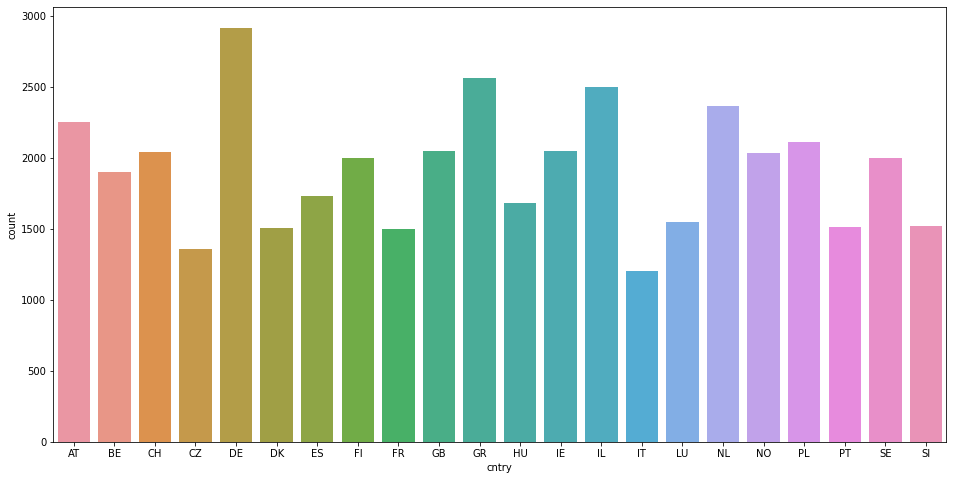

In [11]:
#number of participants per country
plt.figure(figsize=(16,8))
sns.countplot(x = df['cntry'])
#Germany has the highest number of participants

In [67]:
df.describe()

,tvtot,tvpol,rdtot,rdpol,nwsptot,nwsppol,ipcrtiv,imprich,ipeqopt
count,42359.000000,42359.000000,42359.000000,42359.000000,42359.000000,42359.000000,38213.000000,38216.000000,38211.000000
mean,4.403881,4.377558,3.370216,14.527869,1.682901,17.790222,2.622223,4.167286,2.177017
std,4.278962,12.278948,5.111908,26.093127,4.675672,28.517394,1.451044,1.438081,1.343889
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000
25%,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,3.000000,1.000000
50%,4.000000,2.000000,2.000000,2.000000,1.000000,1.000000,2.000000,4.000000,2.000000
75%,6.000000,3.000000,6.000000,5.000000,2.000000,66.000000,3.000000,5.000000,3.000000
max,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,9.000000,9.000000,9.000000


In [89]:
df.columns.values

array(['cntry', 'tvtot', 'tvpol', 'rdtot', 'rdpol', 'nwsptot', 'nwsppol',
       'gndr', 'ipcrtiv', 'imprich', 'ipeqopt'], dtype=object)

In [70]:
for i in df.columns.values:
    print(i)

cntry
tvtot
tvpol
rdtot
rdpol
nwsptot
nwsppol
gndr
ipcrtiv
imprich
ipeqopt


In [23]:
for i in df.columns.values:
    df[i] = df[i].replace(99,np.nan)  #we have to replace all strange values like 99,88,77.. for nans and then remove them 

In [24]:
df.describe()

,tvtot,tvpol,rdtot,rdpol,nwsptot,nwsppol,ipcrtiv,imprich,ipeqopt
count,42324.000000,42310.000000,42328.000000,42245.000000,42313.000000,42261.000000,38213.000000,38216.000000,38211.000000
mean,4.325654,4.267974,3.300180,14.299917,1.577104,17.601902,2.622223,4.167286,2.177017
std,3.304304,11.856046,4.409995,25.756177,3.402703,28.280708,1.451044,1.438081,1.343889
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000
25%,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,3.000000,1.000000
50%,4.000000,2.000000,2.000000,2.000000,1.000000,1.000000,2.000000,4.000000,2.000000
75%,6.000000,3.000000,6.000000,4.000000,2.000000,66.000000,3.000000,5.000000,3.000000
max,88.000000,88.000000,88.000000,88.000000,88.000000,88.000000,9.000000,9.000000,9.000000


In [25]:
for i in df.columns.values:
    df[i] = df[i].replace(88,np.nan)

In [26]:
df.describe()

,tvtot,tvpol,rdtot,rdpol,nwsptot,nwsppol,ipcrtiv,imprich,ipeqopt
count,42293.000000,42251.000000,42266.000000,42063.000000,42274.000000,42105.000000,38213.000000,38216.000000,38211.000000
mean,4.264323,4.151050,3.175933,13.981028,1.497374,17.341076,2.622223,4.167286,2.177017
std,2.406377,11.443683,2.989527,25.350477,2.166120,28.005921,1.451044,1.438081,1.343889
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000
25%,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,3.000000,1.000000
50%,4.000000,2.000000,2.000000,2.000000,1.000000,1.000000,2.000000,4.000000,2.000000
75%,6.000000,3.000000,6.000000,4.000000,2.000000,7.000000,3.000000,5.000000,3.000000
max,77.000000,77.000000,77.000000,77.000000,77.000000,77.000000,9.000000,9.000000,9.000000


In [27]:
for i in df.columns.values:
    df[i] = df[i].replace(77, np.nan  ) 

In [28]:
df.describe()

,tvtot,tvpol,rdtot,rdpol,nwsptot,nwsppol,ipcrtiv,imprich,ipeqopt
count,42280.000000,42230.000000,42250.000000,42033.000000,42252.000000,42077.000000,38213.000000,38216.000000,38211.000000
mean,4.241958,4.114824,3.147976,13.936050,1.458061,17.301376,2.622223,4.167286,2.177017
std,2.040884,11.330604,2.622198,25.303533,1.313264,27.972906,1.451044,1.438081,1.343889
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000
25%,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,3.000000,1.000000
50%,4.000000,2.000000,2.000000,2.000000,1.000000,1.000000,2.000000,4.000000,2.000000
75%,6.000000,3.000000,6.000000,4.000000,2.000000,7.000000,3.000000,5.000000,3.000000
max,7.000000,66.000000,7.000000,66.000000,7.000000,66.000000,9.000000,9.000000,9.000000


In [78]:
df.head()

,cntry,tvtot,tvpol,rdtot,rdpol,nwsptot,nwsppol,gndr,ipcrtiv,imprich,ipeqopt
0,AT,1,1,1,1,1,1,male,2,3,1
1,AT,3,2,4,1,2,2,male,1,3,1
2,AT,7,3,0,66,0,66,female,2,3,2
3,AT,1,1,1,1,2,2,male,1,5,2
4,AT,0,66,1,1,0,66,female,3,5,1


In [29]:
df.dropna(inplace = True) #remove all nans since we have enough data

In [30]:
df.describe()

,tvtot,tvpol,rdtot,rdpol,nwsptot,nwsppol,ipcrtiv,imprich,ipeqopt
count,37578.000000,37578.000000,37578.000000,37578.000000,37578.000000,37578.000000,37578.000000,37578.000000,37578.000000
mean,4.229735,4.149689,3.174464,13.751610,1.452392,17.437091,2.617915,4.167119,2.172468
std,2.040921,11.432183,2.626314,25.154336,1.305619,28.052425,1.444211,1.433636,1.336221
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000
25%,3.000000,1.000000,1.000000,1.000000,0.000000,1.000000,2.000000,3.000000,1.000000
50%,4.000000,2.000000,2.000000,2.000000,1.000000,1.000000,2.000000,4.000000,2.000000
75%,6.000000,3.000000,6.000000,4.000000,2.000000,66.000000,3.000000,5.000000,3.000000
max,7.000000,66.000000,7.000000,66.000000,7.000000,66.000000,9.000000,9.000000,9.000000


In [102]:
df.shape

(23429, 11)

In [103]:
df.head()

,cntry,tvtot,tvpol,rdtot,rdpol,nwsptot,nwsppol,gndr,ipcrtiv,imprich,ipeqopt
0,AT,1.0,1.0,1.0,1.0,1.0,1.0,male,2.0,3.0,1.0
1,AT,3.0,2.0,4.0,1.0,2.0,2.0,male,1.0,3.0,1.0
3,AT,1.0,1.0,1.0,1.0,2.0,2.0,male,1.0,5.0,2.0
5,AT,6.0,6.0,7.0,5.0,3.0,3.0,female,3.0,3.0,1.0
7,AT,3.0,2.0,4.0,3.0,2.0,1.0,female,3.0,4.0,1.0


In [114]:
df.groupby('cntry')['tvtot'].mean().keys()

Index(['AT', 'BE', 'CH', 'CZ', 'DE', 'DK', 'ES', 'FI', 'FR', 'GB', 'GR', 'HU',
       'IE', 'IL', 'NL', 'NO', 'PL', 'PT', 'SE', 'SI'],
      dtype='object', name='cntry')

We can see that in Switzerland and Slovenia people watch less TV than other, while in UK more 


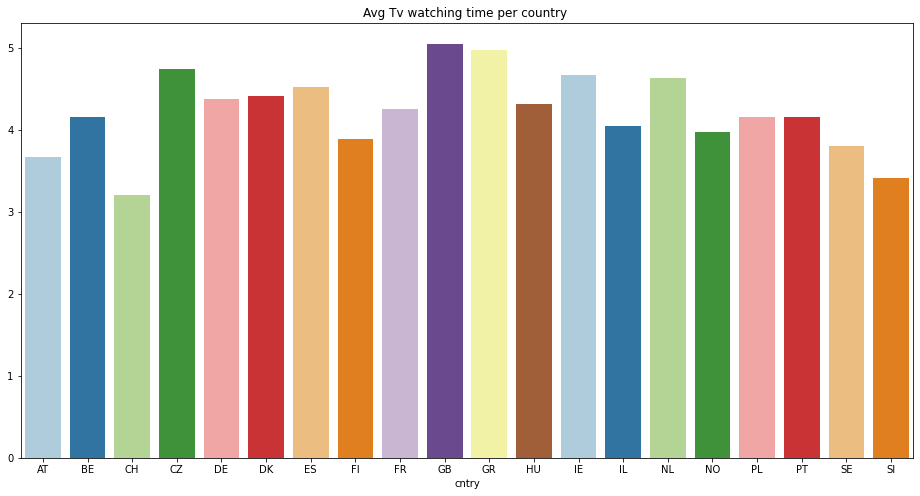

In [31]:
plt.figure(figsize=(16,8))
sns.barplot(x=df.groupby('cntry')['tvtot'].mean().keys(), y=df.groupby('cntry')['tvtot'].mean().values, data=df, palette = 'Paired')
plt.title('Avg Tv watching time per country ') 
plt.show()

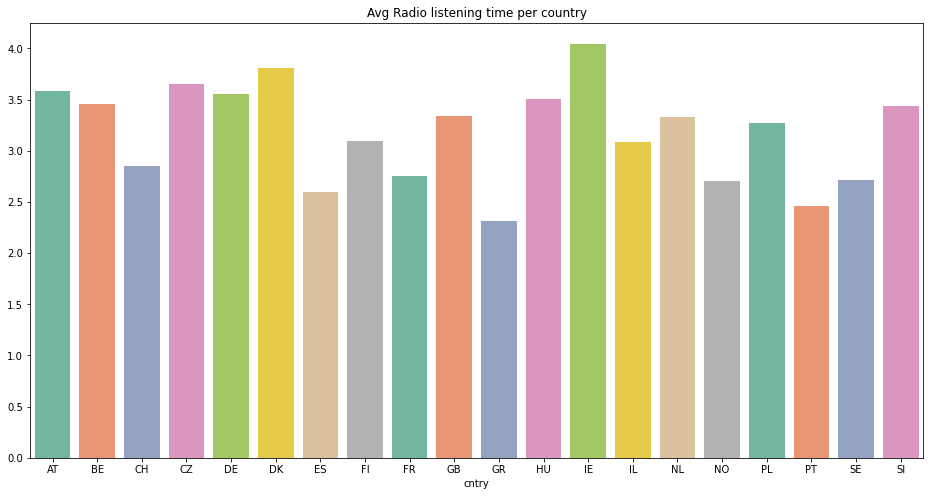

In [32]:
plt.figure(figsize=(16,8))
sns.barplot(x=df.groupby('cntry')['rdtot'].mean().keys(), y=df.groupby('cntry')['rdtot'].mean().values, data=df, palette = 'Set2')
plt.title('Avg Radio listening time per country') 
plt.show()

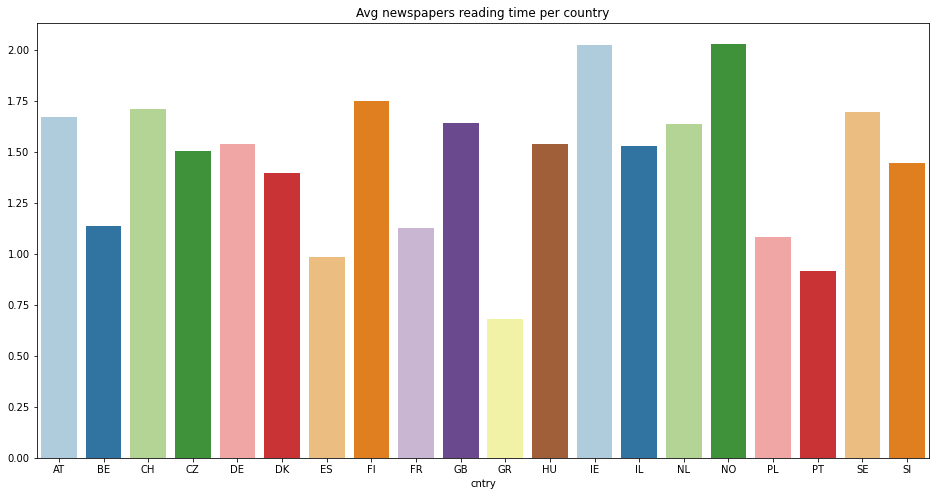

In [33]:
plt.figure(figsize=(16,8))
sns.barplot(x=df.groupby('cntry')['nwsptot'].mean().keys(), y=df.groupby('cntry')['nwsptot'].mean().values, data=df, palette = 'Paired')
plt.title('Avg newspapers reading time per country') 
plt.show()

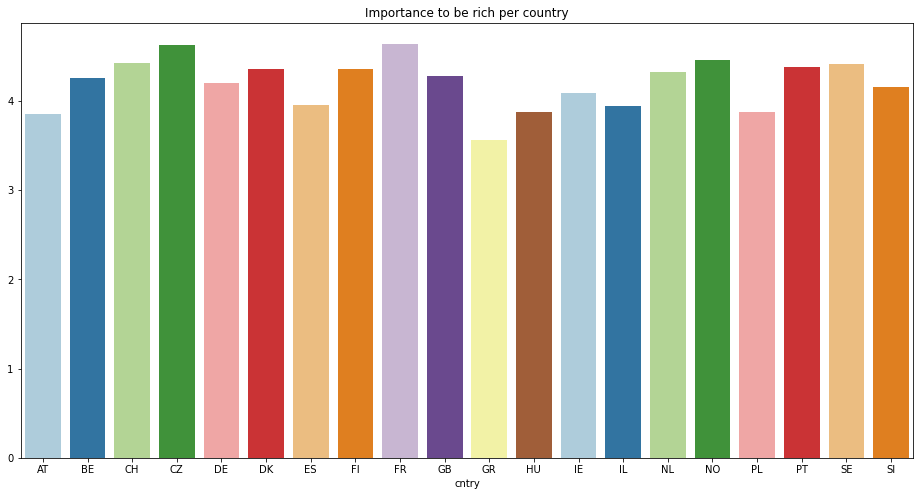

In [34]:
plt.figure(figsize=(16,8))
sns.barplot(x=df.groupby('cntry')['imprich'].mean().keys(), y=df.groupby('cntry')['imprich'].mean().values, data=df, palette = 'Paired')
plt.title('Importance to be rich per country') 
plt.show()

In [124]:
df.head()

,cntry,tvtot,tvpol,rdtot,rdpol,nwsptot,nwsppol,gndr,ipcrtiv,imprich,ipeqopt
0,AT,1.0,1.0,1.0,1.0,1.0,1.0,male,2.0,3.0,1.0
1,AT,3.0,2.0,4.0,1.0,2.0,2.0,male,1.0,3.0,1.0
3,AT,1.0,1.0,1.0,1.0,2.0,2.0,male,1.0,5.0,2.0
5,AT,6.0,6.0,7.0,5.0,3.0,3.0,female,3.0,3.0,1.0
7,AT,3.0,2.0,4.0,3.0,2.0,1.0,female,3.0,4.0,1.0


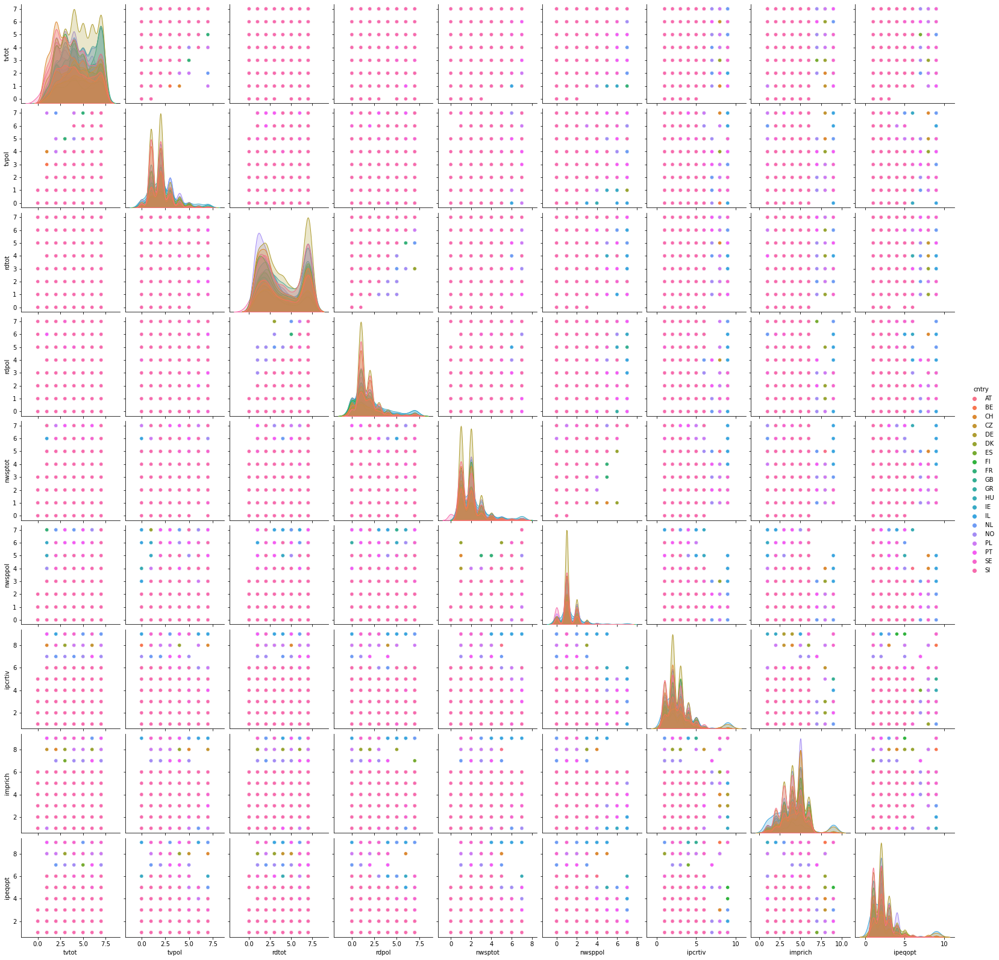

In [126]:
sns.pairplot(df, hue = 'cntry') #testing with graphs

In [35]:
df1 = df[(df['cntry']=='FR') | (df['cntry']=='ES') |(df['cntry']=='GR') | (df['cntry']=='CH')]
df1.head() #choosing France, Switzerland, Spain and Greece for deeper analysis

,cntry,tvtot,tvpol,rdtot,rdpol,nwsptot,nwsppol,gndr,ipcrtiv,imprich,ipeqopt
4156,CH,5.0,2.0,1.0,1.0,1.0,1.0,female,2.0,5.0,1.0
4157,CH,3.0,1.0,2.0,1.0,1.0,1.0,male,1.0,5.0,3.0
4158,CH,5.0,4.0,7.0,3.0,2.0,2.0,male,2.0,6.0,1.0
4159,CH,2.0,1.0,1.0,1.0,1.0,1.0,female,3.0,5.0,2.0
4160,CH,4.0,2.0,3.0,1.0,2.0,1.0,male,2.0,3.0,3.0


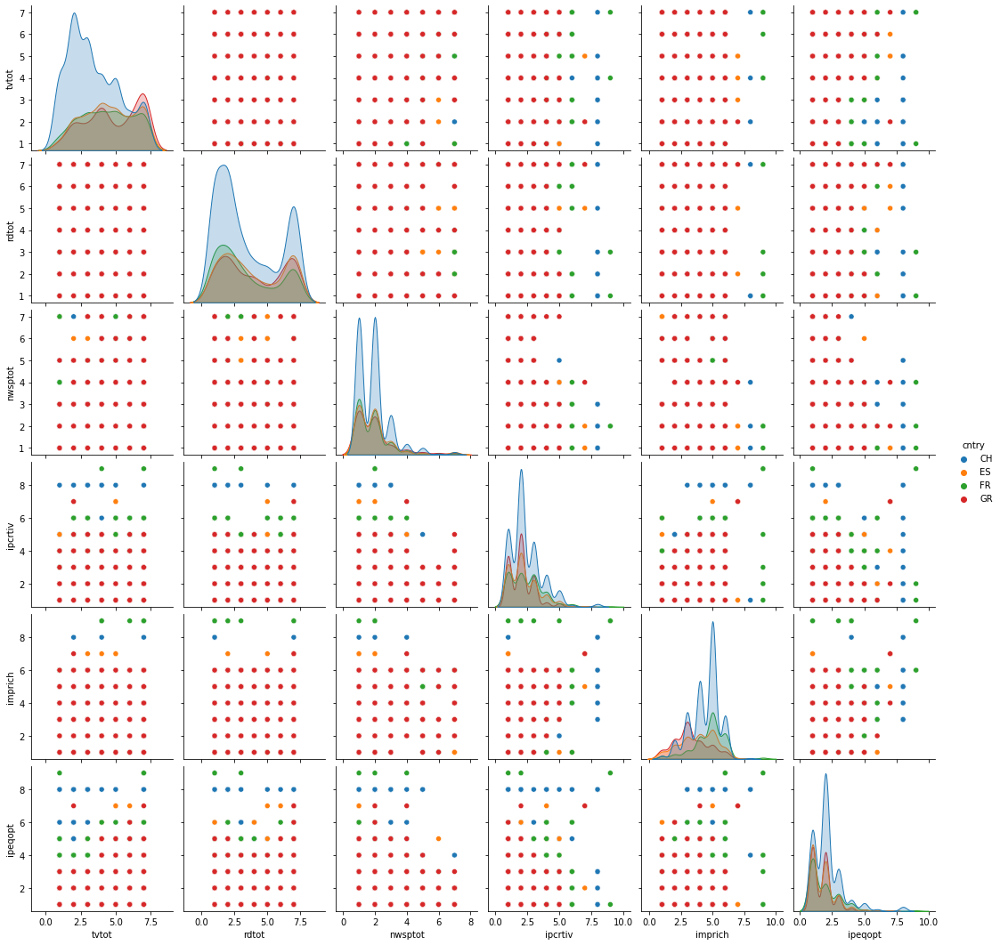

In [132]:
sns.pairplot(df1, vars = ['tvtot', 'rdtot', 'nwsptot',  'ipcrtiv', 'imprich', 'ipeqopt'], hue = 'cntry')
#differente distributions, we can see that Switzerland has a very different behaviour from the other countries 
#the scatter plots don't make sense since all the vars are from 1 to 7 
# in general in Switzerland less tv, radio, newspaper time , while higher importance to be rich and more respondents in general

In [20]:
df1.head()

,cntry,tvtot,tvpol,rdtot,rdpol,nwsptot,nwsppol,gndr,ipcrtiv,imprich,ipeqopt
4156,CH,5,2,1,1,1,1,female,2.0,5.0,1.0
4157,CH,3,1,2,1,1,1,male,1.0,5.0,3.0
4158,CH,5,4,7,3,2,2,male,2.0,6.0,1.0
4159,CH,2,1,1,1,1,1,female,3.0,5.0,2.0
4160,CH,4,2,3,1,2,1,male,2.0,3.0,3.0


Greece, Spain, France, Switzerland - the importance to be rich is higher than the importance of equal opportunities and news ideas


In [38]:
#Distplot
import plotly.figure_factory as ff
etiquetas = ['Importance of new ideas','Importance to be rich', 'Importance of equality']
datos = [df1["ipcrtiv"],df1["imprich"],df1['ipeqopt']]
fig = ff.create_distplot(datos, etiquetas, bin_size=5)
fig.show()

In [141]:
df1.head()

,cntry,tvtot,tvpol,rdtot,rdpol,nwsptot,nwsppol,gndr,ipcrtiv,imprich,ipeqopt
4156,CH,5.0,2.0,1.0,1.0,1.0,1.0,female,2.0,5.0,1.0
4157,CH,3.0,1.0,2.0,1.0,1.0,1.0,male,1.0,5.0,3.0
4158,CH,5.0,4.0,7.0,3.0,2.0,2.0,male,2.0,6.0,1.0
4159,CH,2.0,1.0,1.0,1.0,1.0,1.0,female,3.0,5.0,2.0
4160,CH,4.0,2.0,3.0,1.0,2.0,1.0,male,2.0,3.0,3.0


In [39]:
df2 = df1.groupby('cntry').mean().reset_index()
df2.head() #grouping the means

,cntry,tvtot,tvpol,rdtot,rdpol,nwsptot,nwsppol,ipcrtiv,imprich,ipeqopt
0,CH,3.207965,7.050147,2.851524,12.084562,1.707965,7.882498,2.371190,4.418387,2.117994
1,ES,4.523557,3.666078,2.598351,23.717314,0.982921,32.260895,2.474087,3.951119,1.872203
2,FR,4.253500,5.323508,2.756817,14.133382,1.128224,26.134119,2.426676,4.638909,1.834930
3,GR,4.971970,3.855902,2.313857,27.609159,0.681405,43.152388,2.383735,3.560205,1.828267


In [40]:
df1.columns.values

array(['cntry', 'tvtot', 'tvpol', 'rdtot', 'rdpol', 'nwsptot', 'nwsppol',
       'gndr', 'ipcrtiv', 'imprich', 'ipeqopt'], dtype=object)

In [41]:
cols = ['tvtot', 'rdtot', 'nwsptot', 'gndr', 'ipcrtiv', 'imprich', 'ipeqopt']

In [42]:
for i in cols:
    fig = px.box(df1, x="cntry", y=i, points="all") #compare different variables for these countries 
    fig.show()

In [164]:
df.head()

,cntry,tvtot,tvpol,rdtot,rdpol,nwsptot,nwsppol,gndr,ipcrtiv,imprich,ipeqopt
0,AT,1.0,1.0,1.0,1.0,1.0,1.0,male,2.0,3.0,1.0
1,AT,3.0,2.0,4.0,1.0,2.0,2.0,male,1.0,3.0,1.0
3,AT,1.0,1.0,1.0,1.0,2.0,2.0,male,1.0,5.0,2.0
5,AT,6.0,6.0,7.0,5.0,3.0,3.0,female,3.0,3.0,1.0
7,AT,3.0,2.0,4.0,3.0,2.0,1.0,female,3.0,4.0,1.0


In [43]:
df4 = df.groupby('gndr').mean().reset_index() #avg by gender
df4

,gndr,tvtot,tvpol,rdtot,rdpol,nwsptot,nwsppol,ipcrtiv,imprich,ipeqopt
0,9,4.350000,2.175000,2.975000,11.250000,1.325000,22.175000,4.300000,5.375000,3.625000
1,female,4.261514,4.242748,3.186047,15.091510,1.337789,19.550472,2.698128,4.339303,2.127630
2,male,4.193903,4.050014,3.161953,12.257917,1.580920,15.061530,2.524358,3.971719,2.219362


In [44]:
df['gndr'] = df['gndr'].replace(9, np.nan) #new nan appears


In [45]:
df['gndr'].value_counts(dropna = False)

female    19823
male      17715
NaN          40
Name: gndr, dtype: int64

In [46]:
df['gndr'].dropna(inplace=True)

In [47]:
df['gndr'].value_counts(dropna = False)

female    19823
male      17715
Name: gndr, dtype: int64

There is not much difference in the behaviour of men and women in the chosen variables

In [181]:
fig = px.line_polar(df, r=df4.iloc[:,1:10].values[0], theta= [ 'tvtot', 'tvpol', 'rdtot', 'rdpol', 'nwsptot', 'nwsppol','ipcrtiv', 'imprich', 'ipeqopt' ], line_close=True)
fig.update_traces(fill='toself')
fig.show()  #females

In [182]:
fig = px.line_polar(df, r=df4.iloc[:,1:10].values[1], theta= [ 'tvtot', 'tvpol', 'rdtot', 'rdpol', 'nwsptot', 'nwsppol','ipcrtiv', 'imprich', 'ipeqopt' ], line_close=True)
fig.update_traces(fill='toself')
fig.show() #males

In [184]:
df.head()

,cntry,tvtot,tvpol,rdtot,rdpol,nwsptot,nwsppol,gndr,ipcrtiv,imprich,ipeqopt
0,AT,1.0,1.0,1.0,1.0,1.0,1.0,male,2.0,3.0,1.0
1,AT,3.0,2.0,4.0,1.0,2.0,2.0,male,1.0,3.0,1.0
3,AT,1.0,1.0,1.0,1.0,2.0,2.0,male,1.0,5.0,2.0
5,AT,6.0,6.0,7.0,5.0,3.0,3.0,female,3.0,3.0,1.0
7,AT,3.0,2.0,4.0,3.0,2.0,1.0,female,3.0,4.0,1.0


In [48]:
europe_geo = r'europemap.json' # geojson

# create world map with zoom at Europe
world_map = folium.Map(location=[44.649735, 4.726377], zoom_start=4) 
world_map

In [49]:
world_map.choropleth(
    geo_data=europe_geo,
    data=df, 
    columns=['cntry', 'tvtot'], 
    key_on='feature.properties.ISO2', #country name in json 
     fill_color='Reds', 
     fill_opacity=0.7, 
     line_opacity=0.2,
     legend_name='Television'
)
world_map

C:\Users\zhuzh\AppData\Local\Continuum\anaconda3\lib\site-packages\folium\folium.py:413: FutureWarning:

The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.



In [50]:
europe_geo = r'europemap.json' # geojson

# crea un mapa mundial 
world_map = folium.Map(location=[44.649735, 4.726377], zoom_start=4)
world_map

world_map.choropleth(
    geo_data=europe_geo,
    data=df, 
    columns=['cntry', 'imprich'], 
    key_on='feature.properties.ISO2',
     fill_color='Blues', 
     fill_opacity=0.7, 
     line_opacity=0.2,
     legend_name='Importance to be rich'
)
world_map

In [51]:
europe_geo = r'europemap.json' # geojson

# crea un mapa mundial 
world_map = folium.Map(location=[44.649735, 4.726377], zoom_start=4)
world_map

world_map.choropleth(
    geo_data=europe_geo,
    data=df, 
    columns=['cntry', 'ipeqopt'], 
    key_on='feature.properties.ISO2', #nombre del pais en el json
     fill_color='Greens', 
     fill_opacity=0.7, 
     line_opacity=0.2,
     legend_name='Importance to have new ideas and creativity'
)
world_map

In [52]:
df5 = df[df['tvtot']<4] #dividing in 2 datasets to compare if there is more importance to be rich, equality and ideas in those
#who watch less or more tv 
df5

,cntry,tvtot,tvpol,rdtot,rdpol,nwsptot,nwsppol,gndr,ipcrtiv,imprich,ipeqopt
0,AT,1.0,1.0,1.0,1.0,1.0,1.0,male,2.0,3.0,1.0
1,AT,3.0,2.0,4.0,1.0,2.0,2.0,male,1.0,3.0,1.0
3,AT,1.0,1.0,1.0,1.0,2.0,2.0,male,1.0,5.0,2.0
4,AT,0.0,66.0,1.0,1.0,0.0,66.0,female,3.0,5.0,1.0
7,AT,3.0,2.0,4.0,3.0,2.0,1.0,female,3.0,4.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...
42353,SI,3.0,1.0,2.0,1.0,0.0,66.0,male,3.0,5.0,3.0
42354,SI,1.0,1.0,0.0,66.0,0.0,66.0,male,2.0,2.0,3.0
42355,SI,3.0,3.0,2.0,2.0,1.0,0.0,female,2.0,4.0,2.0
42357,SI,2.0,2.0,2.0,2.0,1.0,0.0,male,1.0,4.0,1.0


In [53]:
df6 = df[df['tvtot']>4]
df6

,cntry,tvtot,tvpol,rdtot,rdpol,nwsptot,nwsppol,gndr,ipcrtiv,imprich,ipeqopt
2,AT,7.0,3.0,0.0,66.0,0.0,66.0,female,2.0,3.0,2.0
5,AT,6.0,6.0,7.0,5.0,3.0,3.0,female,3.0,3.0,1.0
9,AT,7.0,3.0,0.0,66.0,0.0,66.0,female,2.0,2.0,1.0
12,AT,7.0,1.0,1.0,1.0,1.0,1.0,female,1.0,5.0,1.0
13,AT,7.0,1.0,1.0,1.0,2.0,1.0,female,4.0,6.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...
42341,SI,5.0,4.0,6.0,1.0,1.0,1.0,female,1.0,3.0,2.0
42342,SI,5.0,2.0,7.0,3.0,1.0,1.0,male,2.0,5.0,2.0
42346,SI,5.0,2.0,3.0,2.0,1.0,1.0,male,2.0,3.0,1.0
42352,SI,7.0,7.0,0.0,66.0,1.0,1.0,male,6.0,5.0,3.0


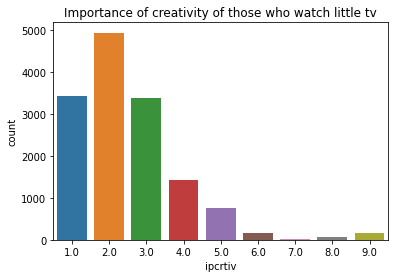

In [54]:
sns.countplot(x = df5['ipcrtiv'])
plt.title('Importance of creativity of those who watch little tv') 
plt.show()

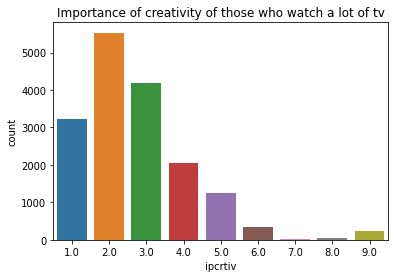

In [55]:
sns.countplot(x = df6['ipcrtiv'])
plt.title('Importance of creativity of those who watch a lot of tv') 
plt.show()

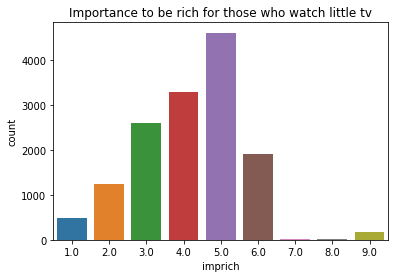

In [57]:
sns.countplot(x = df5['imprich'])
plt.title('Importance to be rich for those who watch little tv') 
plt.show()

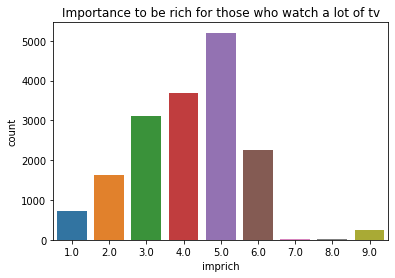

In [56]:
sns.countplot(x = df6['imprich'])
plt.title('Importance to be rich for those who watch a lot of tv') 
plt.show()

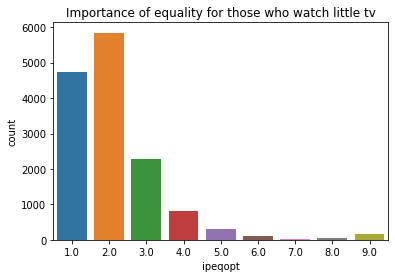

In [59]:
sns.countplot(x = df5['ipeqopt'])
plt.title('Importance of equality for those who watch little tv') 
plt.show()

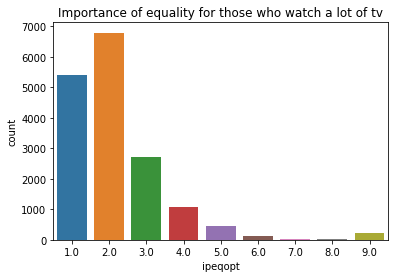

In [58]:
sns.countplot(x = df6['ipeqopt'])
plt.title('Importance of equality for those who watch a lot of tv') 
plt.show()

Looking at this 3 comparisons, there is not much difference in the importance of these 3 variables , the only difference in the number of respondents , there are more replies of those who watch more tv 

In [60]:
df.corr()

,tvtot,tvpol,rdtot,rdpol,nwsptot,nwsppol,ipcrtiv,imprich,ipeqopt
tvtot,1.000000,-0.332121,0.037245,0.047027,0.053785,0.052162,0.070636,-0.017106,0.016043
tvpol,-0.332121,1.000000,-0.013985,0.030878,-0.002626,0.041930,-0.001608,0.017260,0.003841
rdtot,0.037245,-0.013985,1.000000,-0.558063,0.101662,-0.087374,-0.033896,-0.002747,0.014175
rdpol,0.047027,0.030878,-0.558063,1.000000,-0.116900,0.178699,0.047004,0.011547,-0.012839
nwsptot,0.053785,-0.002626,0.101662,-0.116900,1.000000,-0.628104,-0.035729,0.025307,0.010770
nwsppol,0.052162,0.041930,-0.087374,0.178699,-0.628104,1.000000,0.048083,-0.017005,-0.012804
ipcrtiv,0.070636,-0.001608,-0.033896,0.047004,-0.035729,0.048083,1.000000,0.335434,0.410592
imprich,-0.017106,0.017260,-0.002747,0.011547,0.025307,-0.017005,0.335434,1.000000,0.205237
ipeqopt,0.016043,0.003841,0.014175,-0.012839,0.010770,-0.012804,0.410592,0.205237,1.000000


There is not much correlation between the variables

<AxesSubplot:>

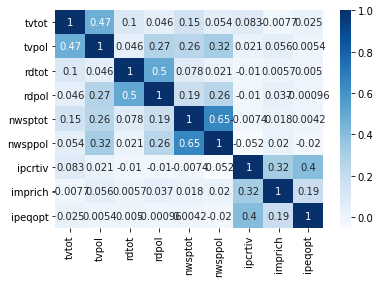

In [227]:
sns.heatmap(df.corr(), annot=True, cmap="Blues")

C:\Users\zhuzh\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



Text(0.5, 1.0, 'Histograma de importancia de tener igualdad')

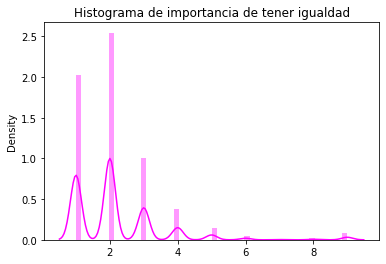

In [62]:
sns.distplot(x =df['ipeqopt'], color = 'Magenta')
plt.title('Histograma de importancia de tener igualdad') #npt much sence 

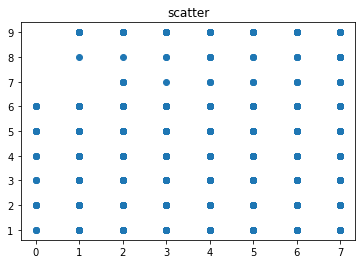

In [230]:
#scatter plot
fig, axes = plt.subplots()
axes.scatter(df['tvtot'], df['imprich']) #not useful for this dataset
axes.set_title("scatter")
plt.show()

In [63]:
from scipy.stats import ttest_ind
ttest, pval = ttest_ind(df5['ipeqopt'], df6['ipeqopt'])
if pval <0.05:
    print("Can't accept they are same")
else:
    print("they are same") 
#comparing 2 hipotesis if those who watch less and more tv have the same behaviour 

Can't accept they are same


In [64]:
fig = px.bar(df, x='tvtot', y='ipeqopt') # no relation between tv time and importance of equality
fig.show()